# MetOpts Lab2

In [24]:
import matplotlib.pyplot as plot
import numpy as np
import math
import pandas as pd

%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


## Задание 1.  
Реализовать стохастический градиентный спуск для решения линейной регрессии. Исследовать сходимость с разным размером батча (1 - SGD, 2...n-1 - Minibatch GD, n - GD из предыдущей работы).  

---

Для решения линейной регрессии будем создавать случайный набор точек, для которого будем искать аппроксимацию прямой.

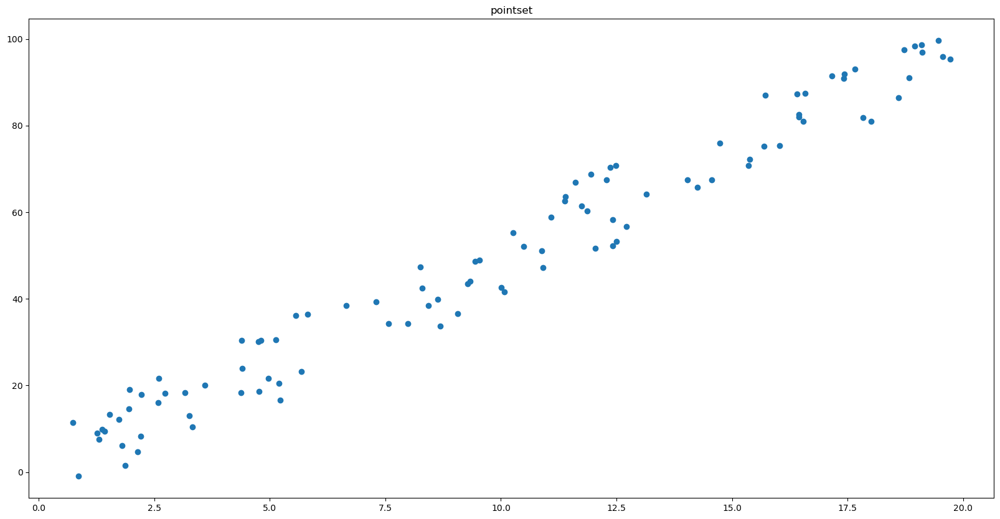

In [25]:
n = 100
x_bound = 20.
y_bound = 5.
coef_bound = 10.

x = x_bound * np.random.random_sample((n,))
y = np.asarray([y_bound * x_i + (np.random.random_sample() * 2 - 1) * coef_bound for x_i in x])
plot.scatter(x, y)
plot.title("pointset")
plot.show()

Для того, чтобы запустить градиентный спуск, нужна формула, результат которой нужно минимизировать. В случае с аппроксимацией прямой будем использовать `loss_function` - сумму квадратичных расстояний до заданного `point_set`. Градиент будем рассчитывать как приращение функции делённое на прирощение аргумента. Так нам не придется находить производную `loss_function`.

In [26]:
def loss_func(x, y, batch_size):
    return lambda c, id: sum(
        (y[id * batch_size : (id + 1) * batch_size + 1]
        - (c[1] * x[id * batch_size : (id + 1)
        * batch_size + 1] + c[0])) ** 2
        )

loss_full = loss_func(x, y, n)

def grad(c, f, id, delta=1e-8):
    return np.array([
        (f(c + [delta, 0], id) - f(c - [delta, 0], id)) / (2 * delta),
        (f(c + [0, delta], id) - f(c - [0, delta], id)) / (2 * delta)
    ])

def next_res_gen(x, y, delta=1e-8):
    def next(c, id, lr, loss_func):
        return c - lr * grad(c, loss_func, id)
    return next


def sgd(start, lr, lr_func, next_result, loss, batch_size, n, epochs=1000, eps=1e-8):
    points = []
    
    c = start
    batch_id = 0
    diff = loss(c, batch_id)
    for epoch in range(epochs):
        points.append(c)
        
        c = next_result(c, batch_id, lr, loss)
        batch_id = (batch_id + 1) % (n // batch_size)
        lr = lr_func(lr, epoch)
        prev_diff, diff = diff, loss(c, batch_id)
        if abs(diff - prev_diff) < eps:
            break
    
    return c, np.array(points)

In [27]:
def draw(ax, x, y, c):
    ax.scatter(x, y)
    ax.set_title("Аппроксимация")
    ax.plot(x, x * c[1] + c[0])
    plot.show()

Для проверки работы градиентного спуска запустим его на нашем наборе точек с неизменяемым `learning_rate` и размером батча `bsize = 10`.

In [28]:
def const_lr_func(lr, epoch):
    return lr

bsize = 10

cf = sgd(
    np.array([0., 0.]),
    0.00001,
    const_lr_func,
    next_res_gen(x, y),
    loss_func(x, y, bsize),
    bsize,
    n
    )[0]

Посмотрим на получившуюся аппроксимацую прямой. Как видим, алгоритм вполне работает и хорошо находит аппроксимацию даже с небольшим размером батча. 

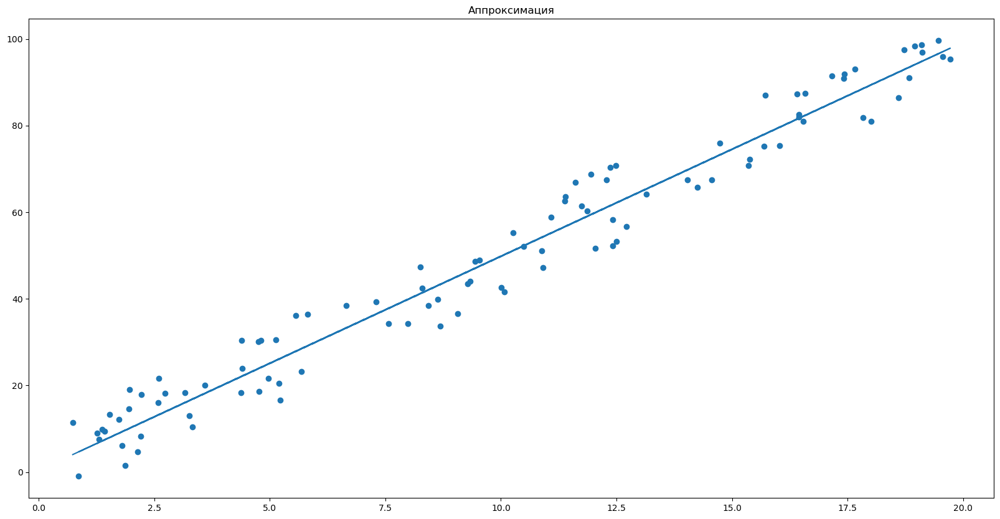

In [29]:
fig, ax = plot.subplots()
draw(ax, x, y, cf)

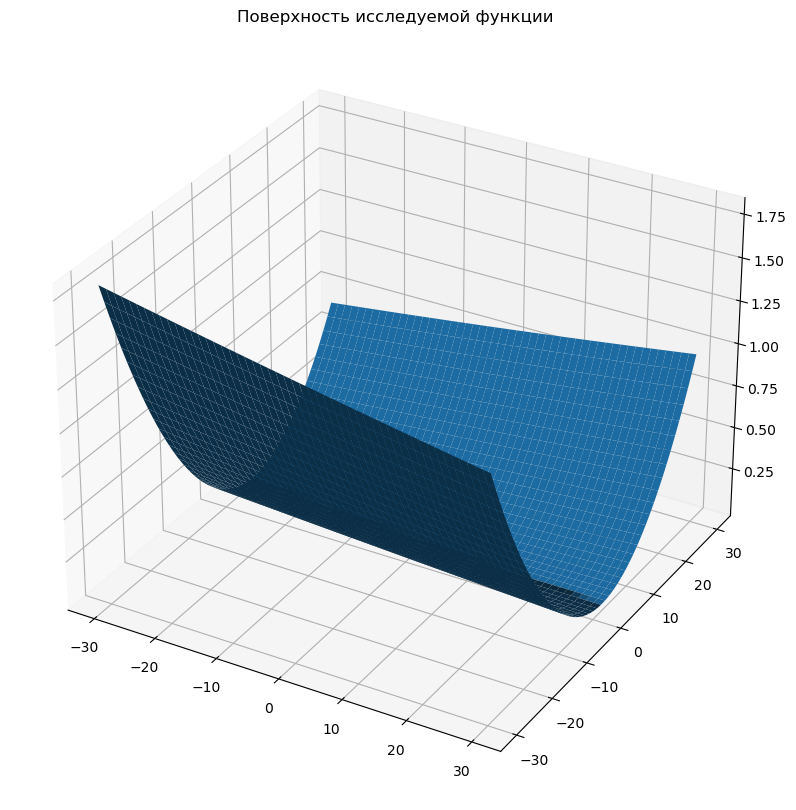

In [30]:
def draw_3d(x,y, title = "Поверхность исследуемой функции"):
    plot.rcParams["figure.figsize"] = (20, 10)
    t = np.linspace(-30, 30, 1000)
    X, Y = np.meshgrid(t, t)

    def fair_fn(c0, c1):
        return sum((y - c1 * x - c0) ** 2 for x, y in zip(x, y))

    ax = plot.figure().add_subplot(projection="3d")
    ax.set_title(title)
    ax.plot_surface(X, Y, fair_fn(X, Y))
    plot.show()

draw_3d(x, y)

Теперь рассмотрим результаты, получаемые с различными размерами батчей. 

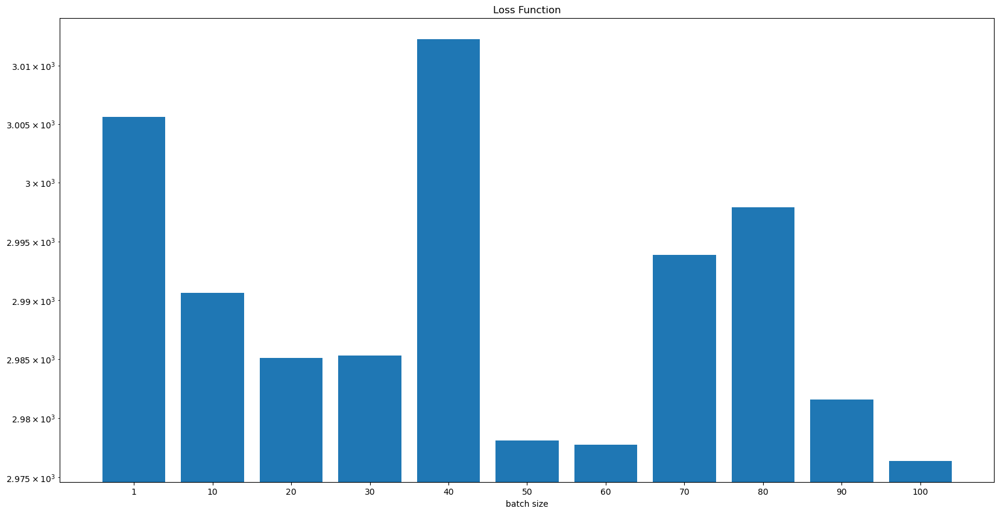

In [31]:
BATCHES = np.asarray([1] + list(range(10, 101, 10)))

def show_sgd_with_different_batches(batches = BATCHES):
    loss = np.array([0.] * len(batches))
    for i, batch in enumerate(batches):
        cf = sgd(
        np.array([0., 0.]),
        0.00005,
        const_lr_func,
        next_res_gen(x, y),
        loss_func(x, y, batch),
        batch,
        n
        )[0]
        loss[i] = loss_full(cf, 0)
    fig, ax = plot.subplots()
    ax.bar(list(map(str, batches)), loss)
    ax.set_yscale("log")
    ax.set_title("Loss Function")
    ax.set_xlabel("batch size")

    plot.show()

show_sgd_with_different_batches()

Как видим, в случае SGD (`bsize = 1`) результат получается самый плохой (из батчей 1, 50, 100). В случае GD (`bsize = 100`) результат самый лучший. Для MGD с разными размерами батчей результат получается разный. Это происходит из-за того, что если `batch_size` не является делитем 100, то некоторые точки просто не учитываются в рассчете. В дальнейшем мы будем рассматривать размеры батчей `1`, `50`, `100`.

## Задание 2.   
Исследовать влияние предварительной нормализации данных (scaling) на сходимость

---

Применим на входных данных `min-max scaling`. После предварительной нормализации данных, исследуемая функция должна получиться менее вытянутой и градиетный спуск примененный на ней будет сходиться быстрее.  

In [32]:
def scaled(x):
    mn = min(x)
    mx = max(x)
    return np.array([(xi - mn) / (mx - mn) for xi in x])

sx = scaled(x)
sy = scaled(y)


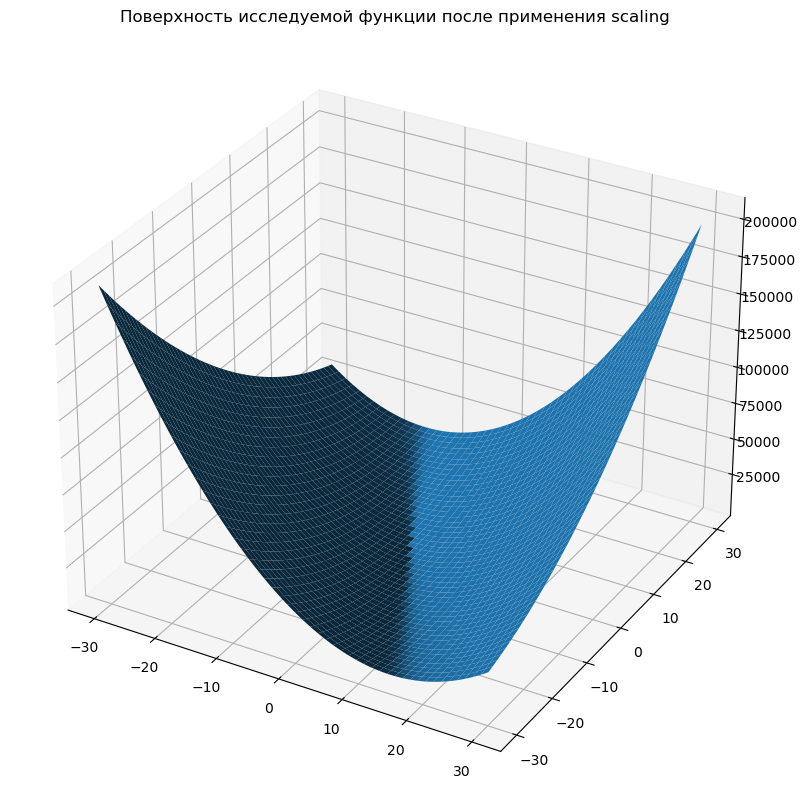

In [33]:
draw_3d(sx,sy, "Поверхность исследуемой функции после применения scaling")

Так же как и в первом задании запустим градентный спуск с разными размерами батчей.

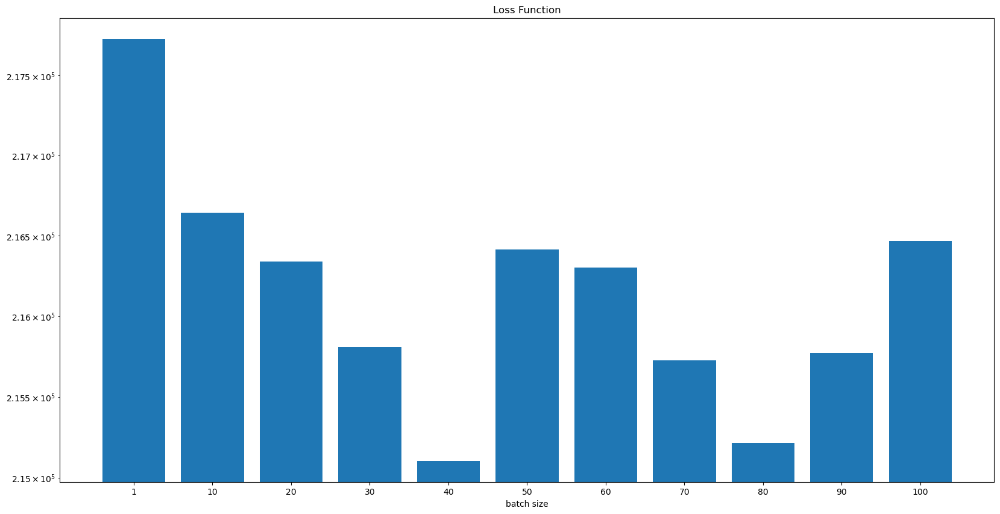

In [34]:
def show_sgd_with_different_batches(batches = BATCHES):
    loss = np.array([0.] * len(batches))
    for i, batch in enumerate(batches):
        cf = sgd(
        np.array([0., 0.]),
        0.005,
        const_lr_func,
        next_res_gen(sx, sy),
        loss_func(sx, sy, batch),
        batch,
        n,
        epochs = 3000
        )[0]
        loss[i] = loss_full(cf, 0)

    fig, ax = plot.subplots()
    ax.bar(list(map(str, batches)), loss)
    ax.set_yscale("log")
    ax.set_title("Loss Function")
    ax.set_xlabel("batch size")

    plot.show()

show_sgd_with_different_batches()

  После применения `scaling` влияние аргументов уменьшилось, и "выбивыющиеся из ряда" точки стали меньше портить получаемую аппроксимацию, от чего влияние размера батча уменьшилось и функция сходится быстрее при разных размерах батча.  
В последующих заданиях будем также использовать нормализованные данные.

## Задание 3.   
Исследовать модификации градиентного спуска (Nesterov, Momentum, AdaGrad, RMSProp, Adam).   

---

Функция для изображения траектории функции.

In [35]:
# scaled x and y
x = sx
y = sy

def draw_plot(ax, x, y, points, title = ""): 
    X, Y = np.meshgrid(
        np.linspace(-1, 1, 1000),
        np.linspace(-0.5, 2, 1000)
    )

    def fair_fn(c0, c1):
        return sum((y - c1 * x - c0) ** 2 for x, y in zip(x, y))
    
    ax.contour(X, Y, fair_fn(X, Y), levels=sorted(list(set([fair_fn(*p) for p in points]))))
    ax.plot(points[:, 0], points[:, 1], "o-", color="red")
    if title:
        ax.set_title(title)

Функция для вывода и сравнения метода на разных размерах батчей. 

In [36]:
collected_results = np.zeros((6,3))
def draw_method(method, lr, start_point = np.array([0., 0.]), batches = [1,50,100], epochs = 1000):
    fig, axs = plot.subplots(len(batches) + 2,1)
    fig.set_size_inches(20, 10 * (len(batches) + 2))
    loss = np.array([0.] * len(batches))
    ptss = [] 
    cfs = []

    for i,batch_size in enumerate(batches):
        cf, points = sgd(
            start_point,
            lr,
            const_lr_func,
            method,
            loss_func(x, y, batch_size),
            batch_size,
            n,
            epochs = epochs
        )
        cfs.append(cf)
        ptss.append(points)
        loss[i] = loss_full(cf, 0)
    
    axs[0].bar(list(map(str, batches)), loss)
    axs[0].set_yscale("log")
    axs[0].set_title("Loss Function")
    axs[0].set_xlabel("batch size")
    axs[1].scatter(x, y)
    
    for i in range(len(batches)):
        axs[1].plot(x, x * cfs[i][1] + cfs[i][0], label = f"{'SGD' if batches[i] == 1 else 'GD' if batches[i] == 100 else 'MGD'+str(batches[i])}")
    
    axs[1].set_title(f"Аппроксимация - {method.__class__.__name__}")
    axs[1].legend()
    
    for i in range(2, len(batches) + 2):
        draw_plot(axs[i], x, y, ptss[i - 2], 
            title = f"Траектория спуска модификации {'SGD' if batches[i-2] == 1 else 'GD' if batches[i-2] == 100 else 'MGD'+str(batches[i-2])} - {method.__class__.__name__} "
        )
    
    plot.show()
    return loss


Для того чтобы было с чем сравнивать так же добавим классический sgd без модификаций.

In [37]:
class VanillaSGD:
    def __init__(self):
        self.g = np.array([0., 0.])

    def __call__(self, c, batch_id, lr, loss):
        self.g = grad(c,loss,batch_id)
        return c - lr * self.g

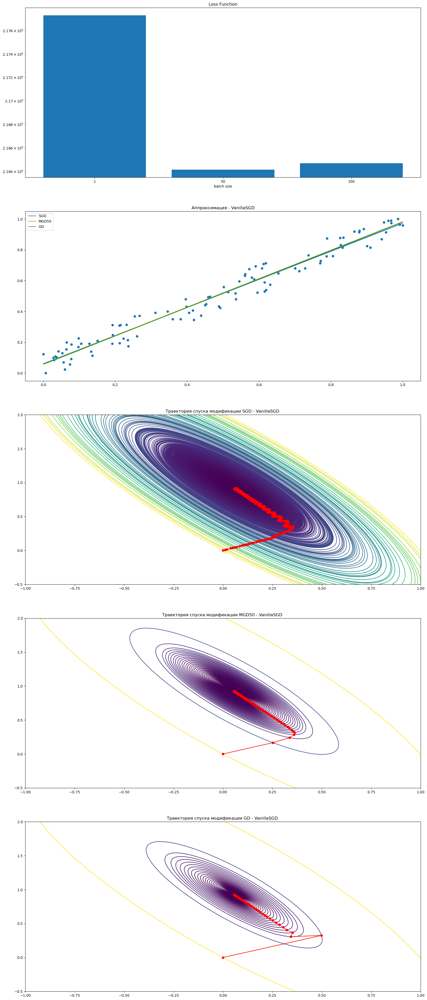

In [38]:
collected_results[0] = draw_method(VanillaSGD(), 0.005, epochs = 3000) #SGD без модификаций настолько плох, что надо дать ему побольше эпох 
#ну либо менять lr на более большой, но в данном случае хочется иметь одианковый lr для всех размеров батчей, чтобы удобнее сравнивать

В классическом варианте SGD можно проследить следующую проблему - хоть точность и получается приемлимой, но для достижения этой точности требуется большое количество шагов. Для улучшения скорости сходимости рассмотрим модификации.   

### Momentum

Momentum — это метод, который помогает ускорить SGD в соответствующем направлении и гасит колебания. Это происходит путём добавления части $\beta$ сдвига на предущем шаге к новому шагу на основе градиента.    
$g_{new} = \beta \times g_{prev} + (1 - \beta) \times grad(с) $     
$c_{new} = c_{prev} - lr * g_{new}$

In [39]:
class Momentum:
    def __init__(self, beta):
        self.beta = beta
        self.g = np.array([0., 0.])

    def __call__(self, c, batch_id, lr, loss):
        self.g = self.beta * self.g + (1. - self.beta) * grad(c, loss, batch_id)
        return c - lr * self.g

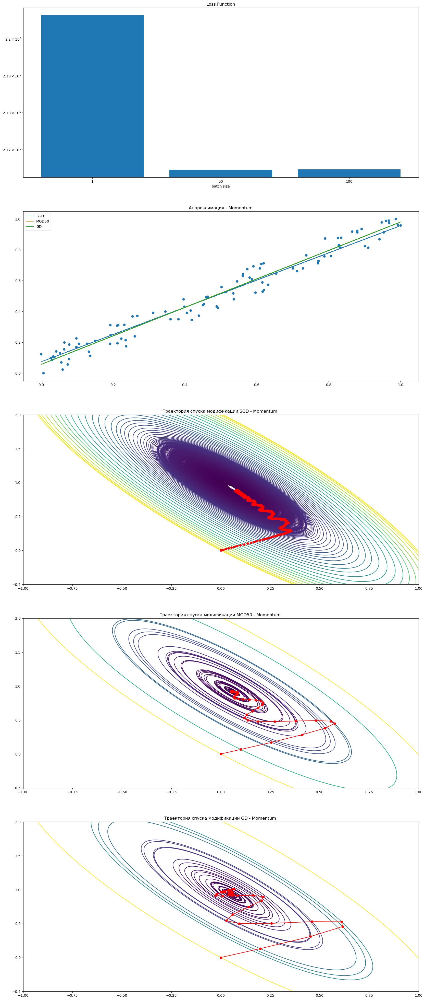

In [40]:
collected_results[1] = draw_method(Momentum(0.8), 0.01)

### Nesterov

Nesterov - использует ту же идею, что в модификации `Momentum`, но теперь градиент рассчитывается на основе "предсказанной" точки.    
$g_{new} = \beta \times g_{prev} + lr \times grad(с - g_{prev} * \beta) $     
$c_{new} = c_{prev} - g_{new}$

In [41]:
class Nesterov:
    def __init__(self, beta):
        self.eps = beta
        self.g = np.array([0., 0.])

    def __call__(self, c, batch_id, lr, loss):
        self.g = self.eps * self.g + lr * grad(c - self.g * self.eps, loss, batch_id)
        return c - self.g

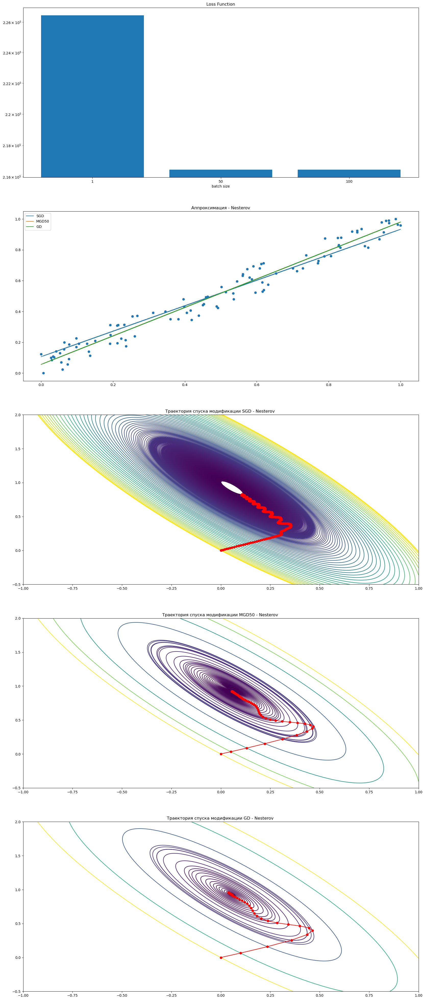

In [42]:
collected_results[2] = draw_method(Nesterov(0.85), 0.001, batches = [1,50,100])

### AdaGrad

AdaGrad - метод, позволяющий бороться с осцилляцией следующим образом. Он слабо меняет коэффициенты, которые ранее менялись быстро, и сильно меняет коэффициенты, которые ранее менялись медленно. Для этого для каждого коэффициента будет хранить сумму квадратов градиентов.   
$G = G + {grad^2}$   
$C_{new} = C_{prev} - grad \times \frac {lr} {\sqrt{G} + \epsilon} $


In [43]:
class AdaGrad:
    def __init__(self):
        self.eps = 1e-8
        self.g = np.array([0., 0.])

    def __call__(self, c, batch_id, lr, loss):
        gr = grad(c, loss, batch_id)
        
        self.g += gr ** 2
        return c - gr * lr / (np.sqrt(self.g) + self.eps)

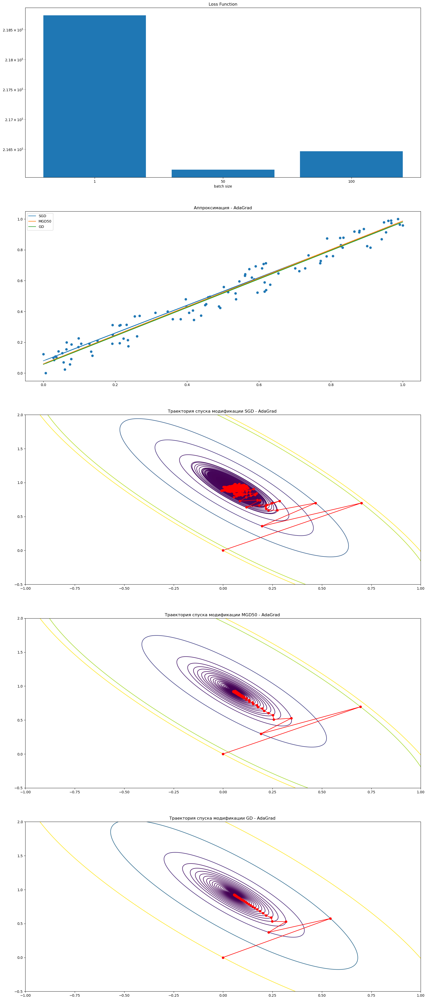

In [44]:
collected_results[3] = draw_method(AdaGrad(), 0.7)

### RMSProp

RMSProp - метод, борющийся с проблемой AdaGrad. Вместо того, чтобы хранить сумму квадратов градиентов, теперь сумма градиентов определяется как убывающее среднее всех прошлых квадратов градиентов.    
$G = \gamma \times G + (1 - \gamma) \times {grad^2}$   
$C_{new} = C_{prev} - grad \times \frac {lr} {\sqrt{G} + \epsilon} $


In [45]:
class RMSProp:
    def __init__(self, gamma):
        self.eps = 1e-8
        self.g = np.array([0., 0.])
        self.gamma = gamma
        
    def __call__(self, c, batch_id, lr, loss):
        gr = grad(c, loss, batch_id)

        self.g = self.g * self.gamma + (1 - self.gamma) * (gr ** 2)
        return c - gr * lr / (np.sqrt(self.g) + self.eps)
    

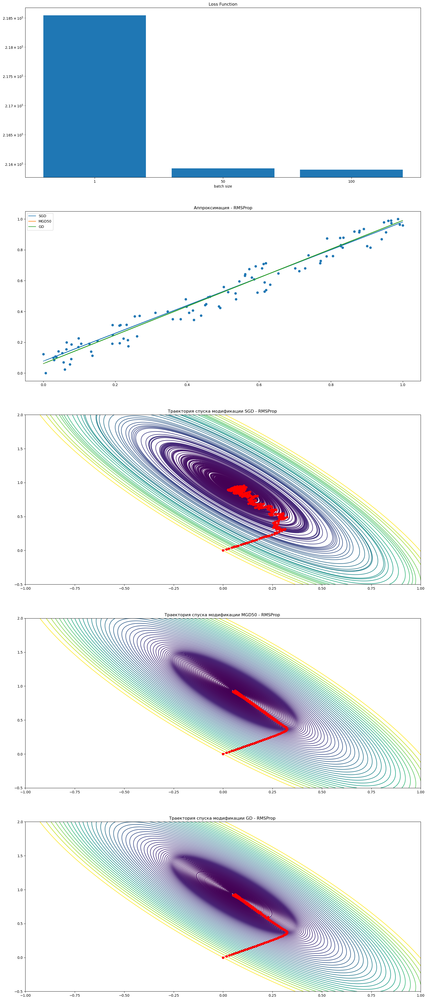

In [46]:
collected_results[4] = draw_method(RMSProp(0.69), 0.01)

### Adam

Adam - так же как и в RMSProp, хранит внутри убывающее среднее квадратов градиентов, и так же как и в Momemntum хранит убывающее среднее градиентов   
$m = \beta \times m + (1 - \beta) \times {grad}$  
$G = \gamma \times G + (1 - \gamma) \times {grad^2}$  
$C_{new} = C_{prev} - lr \times \frac {m} {\sqrt{G} + \epsilon} $

In [47]:
class Adam:
    def __init__(self, beta, gamma):
        self.eps = 1e-8
        self.beta = beta
        self.gamma = gamma
        self.s1 = np.array([0., 0.])
        self.s2 = np.array([0., 0.])
    
    def __call__(self, c, batch_id, lr, loss):
        gr = grad(c, loss, batch_id)
        self.s1 = self.beta * self.s1 + (1- self.beta) * gr
        self.s2 = self.gamma * self.s2 + (1 - self.gamma) * (gr ** 2)
        return c - lr * self.s1 / (np.sqrt(self.s2) + self.eps)



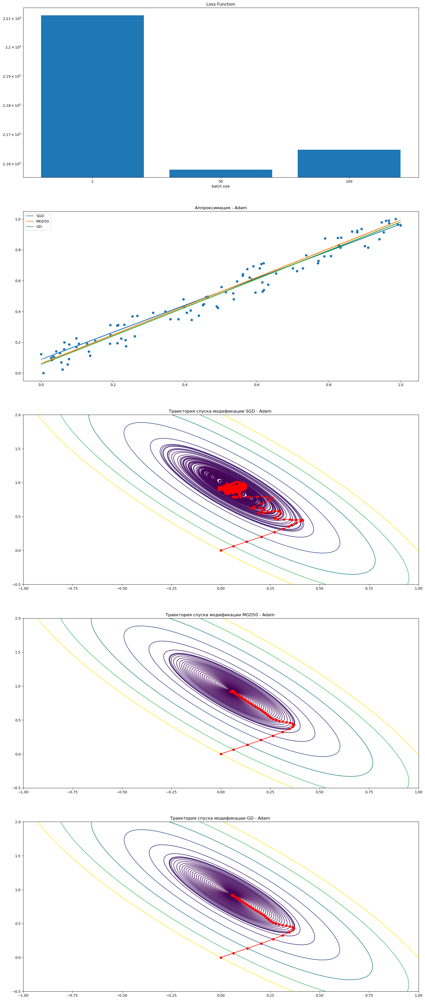

In [48]:
collected_results[5] = draw_method(Adam(0.6, 0.9), 0.05)

Вывод. Без модификаций SGD показывает хорошие только при большом количестве эпох, но зато использует меньше ресурсов. В разных модификациях SGD показывает хорошие результаты, улучшая скорость сходимости, при этом сохраняя приемущество SGD перед GD - минимизацию используемый ресурсов. 

## Задание 4.   
Исследуйте сходимость алгоритмов. Сравнить различные методы по скорости сходимости, надежности, требуемым машинным ресурсам (объем оперативной памяти, количеству арифметичких операций, времени выполнения).

---

In [56]:
def epoch_count(res):
    print(f"Result  = {res[0]}")
    print(f"Epoches = {len(res[1])}")

bsize = 100

In [57]:
%%time
%memit epoch_count(sgd(np.array([0., 0.]), 0.01, const_lr_func, Momentum(0.8), loss_func(x, y, bsize), bsize, n))

Result  = [0.05644282 0.92388726]
Epoches = 94
Result  = [0.05644282 0.92388726]
Epoches = 94
Result  = [0.05644282 0.92388726]
Epoches = 94
Result  = [0.05644282 0.92388726]
Epoches = 94
peak memory: 318.64 MiB, increment: 0.00 MiB
CPU times: total: 141 ms
Wall time: 3.15 s


In [58]:
%%time
%memit epoch_count(sgd(np.array([0., 0.]), 0.001, const_lr_func, Nesterov(0.85), loss_func(x, y, bsize), bsize, n))

Result  = [0.05642165 0.92391043]
Epoches = 93
Result  = [0.05642165 0.92391043]
Epoches = 93
Result  = [0.05642165 0.92391043]
Epoches = 93
Result  = [0.05642165 0.92391043]
Epoches = 93
peak memory: 318.64 MiB, increment: 0.00 MiB
CPU times: total: 156 ms
Wall time: 3.11 s


In [59]:
%%time
%memit epoch_count(sgd(np.array([0., 0.]), 0.7, const_lr_func, AdaGrad(), loss_func(x, y, bsize), bsize, n))

Result  = [0.05645944 0.92384007]
Epoches = 83
Result  = [0.05645944 0.92384007]
Epoches = 83
Result  = [0.05645944 0.92384007]
Epoches = 83
Result  = [0.05645944 0.92384007]
Epoches = 83
peak memory: 318.64 MiB, increment: 0.00 MiB
CPU times: total: 141 ms
Wall time: 3.15 s


In [60]:
%%time
%memit epoch_count(sgd(np.array([0., 0.]), 0.01, const_lr_func, RMSProp(0.69), loss_func(x, y, bsize), bsize, n))

Result  = [0.06149196 0.9287803 ]
Epoches = 139
Result  = [0.06149196 0.9287803 ]
Epoches = 139
Result  = [0.06149196 0.9287803 ]
Epoches = 139
Result  = [0.06149196 0.9287803 ]
Epoches = 139
peak memory: 318.64 MiB, increment: 0.00 MiB
CPU times: total: 156 ms
Wall time: 3.09 s


In [61]:
%%time
%memit epoch_count(sgd(np.array([0., 0.]), 0.05, const_lr_func, Adam(0.6, 0.9), loss_func(x, y, bsize), bsize, n))


Result  = [0.05649198 0.92377665]
Epoches = 62
Result  = [0.05649198 0.92377665]
Epoches = 62
Result  = [0.05649198 0.92377665]
Epoches = 62
Result  = [0.05649198 0.92377665]
Epoches = 62
peak memory: 318.64 MiB, increment: 0.00 MiB
CPU times: total: 156 ms
Wall time: 3.24 s


| критерий\метод      | Momentum | Nesterov | AdaGrad | RMSProp | Adam   |
|---------------------|----------|----------|---------|---------|--------|
| Время работы        | 141      | 156      | 141     | 156     | 156    |
| Скорость сходимости | 94       | 93       | 83      | 139     | 62     |
| Оперативная память  | 318.64   | 318.64   | 318.64  | 318.64  | 318.64 |

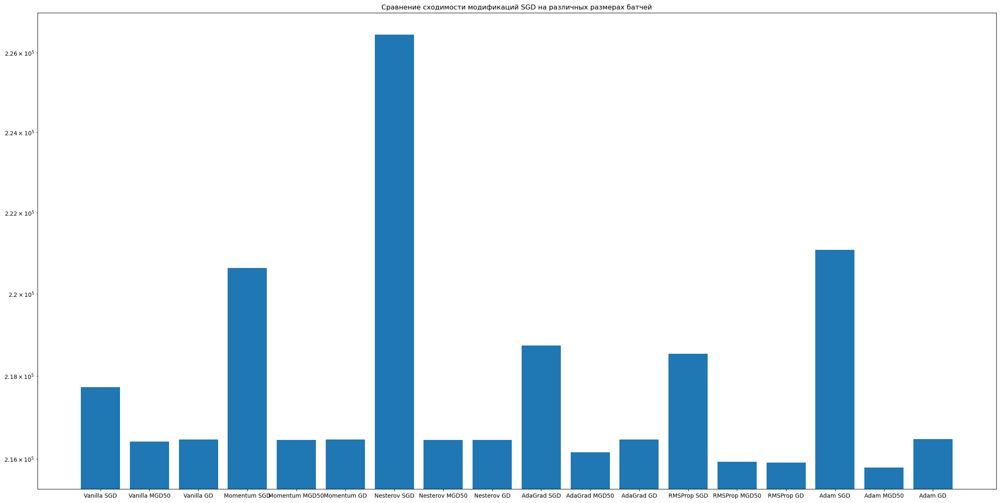

In [62]:
def compare_convergence(res = collected_results):
    fig, ax = plot.subplots()
    fig.set_size_inches(30, 15)
    names = [" ".join([name,batch]) for name in ["Vanilla","Momentum","Nesterov","AdaGrad","RMSProp","Adam"] for batch in ["SGD","MGD50","GD"]]
    ax.bar(names, res.flatten())
    ax.set_yscale("log")
    ax.set_title("Сравнение сходимости модификаций SGD на различных размерах батчей")
    plot.show()

compare_convergence()

Для данного **рандомного** набора точек  
Лучшую скорость сходимости показали методы: Adam, AgaGrad, Nesterov  
Лучшая точность: Adam, RMSProp, AdaGrad  
Лучшее время выполнения: Momentum, AdaGrad 
  
Объем оперативной памяти оказался почти одинаковым из-за хранения в каждой модификации констанотного количества дополнительных данных  
  
Все модификации вычисляют градиент (используя два вызова рассматриваемой функции) только один раз за эпоху, остальными же арифметическими операциями модификации отличаются на константное число раз. Это значит, что при лучшей сходимости алгоритма выполныется меньшее кол-во операций.